# Baseline selection
This document contains a bunch of plots that will exlain why we use a certain baseline for the project.

## Discussion of similarity
We first discuss which time series we want to consider as similar. We want to explore which nGrams are used together. Because there might be a normal usage of certain words or phrases in the day to day life, interesting data might be hidden by an overall large number and therefore interesting changes in usage patterns might not be discovered when total numbers of mentiones are compared. Consider the following example: $n_1 \Rightarrow n_2$ but not vice versa and $n_2$ is already used in many books but $n_1$ is a new nGram at a certain point of time. This implication cannot be found by comparing total numbers, because $n_2$ might be way larger than $n_1$ but the implication will lead to similar changes in the overall time series.

Furthermore we limit our analysis (in this document) to the "match count" because it seems to be more useful for later research than the less fine graned "unique book count".

## Preparation

load modules and data

In [1]:
include("../julia/lib.jl")
include("../julia/img.jl")
include("../julia/pruning_test.jl")
using Gadfly
using DataFrames

set_default_plot_size(25cm, 15cm)

map_i2s, map_s2i = loadmap("../data/final.map")
n = length(map_i2s)
m = 256
data = loaddata("../data/v0.data", m, n)

year_first = 1753
t = collect(year_first:(year_first + m - 1))
print()

## Relative values (percentages)

We calculate the sum (totals) of all mentions first:

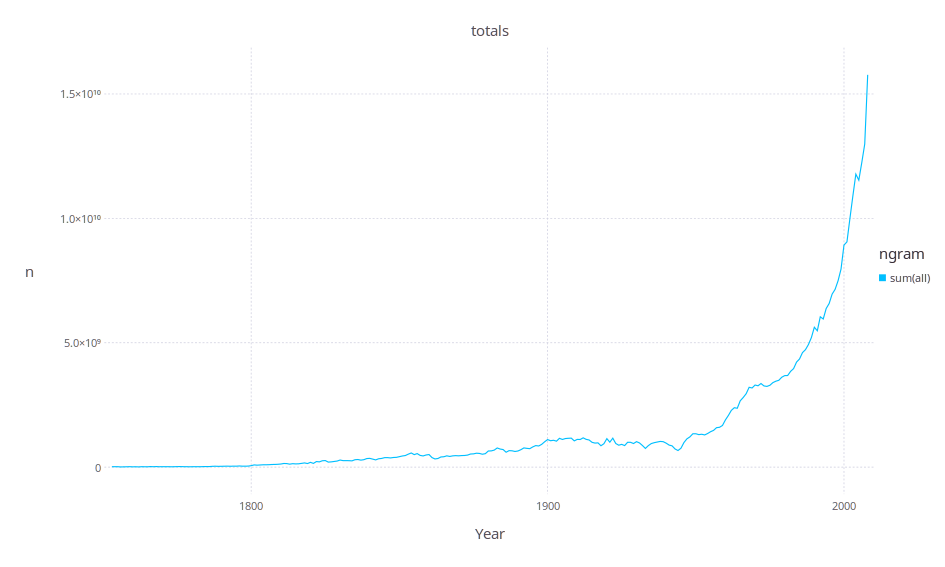

In [2]:
totals = convert(Array{Float64}, sum(data, 2))[:,1]
transform_percentages = x -> x ./ totals
plot_dataframe(DataFrame(x=t, y=totals, label="sum(all)"), "totals")

The graph shows that there is no straight grow but rather that the total number itself has a structure. This structure can influence other time series when they're normalized by that number. To demonstrate this we pick the following words:

In [3]:
ngrams_relative_demo = ["war", "death", "without", "area"]

4-element Array{ASCIIString,1}:
 "war"    
 "death"  
 "without"
 "area"   

No we plot them using their absolute numbers. You can observe the following: the words "without", "area" and "death" share the global low around 1945 while the word "war" does not. On the other hand you can see the same structure (peak and then depression) between 1961 and 1977 for "war" and "without".

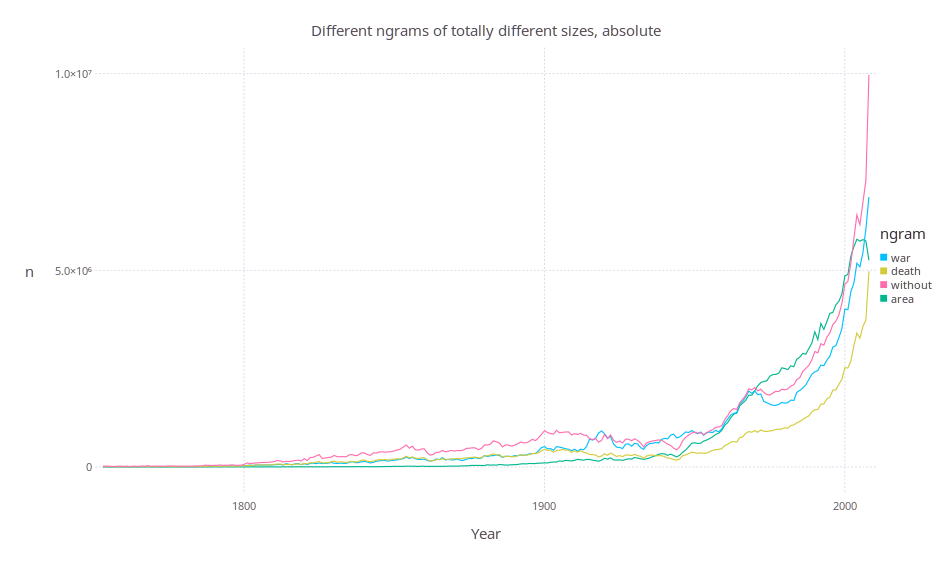

In [4]:
plot_all_that(data, map_s2i, t, ngrams_relative_demo, norm_id, transform_id, "Different ngrams of totally different sizes, absolute")

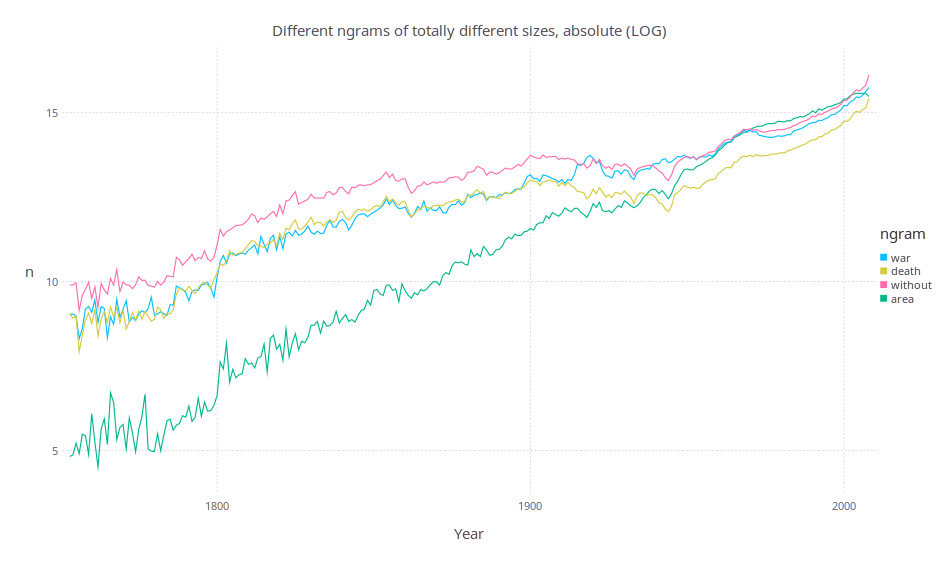

In [5]:
plot_all_that(data, map_s2i, t, ngrams_relative_demo, norm_id, transform_log, "Different ngrams of totally different sizes, absolute (LOG)")

This similarity can not be observed when using relative numbers:

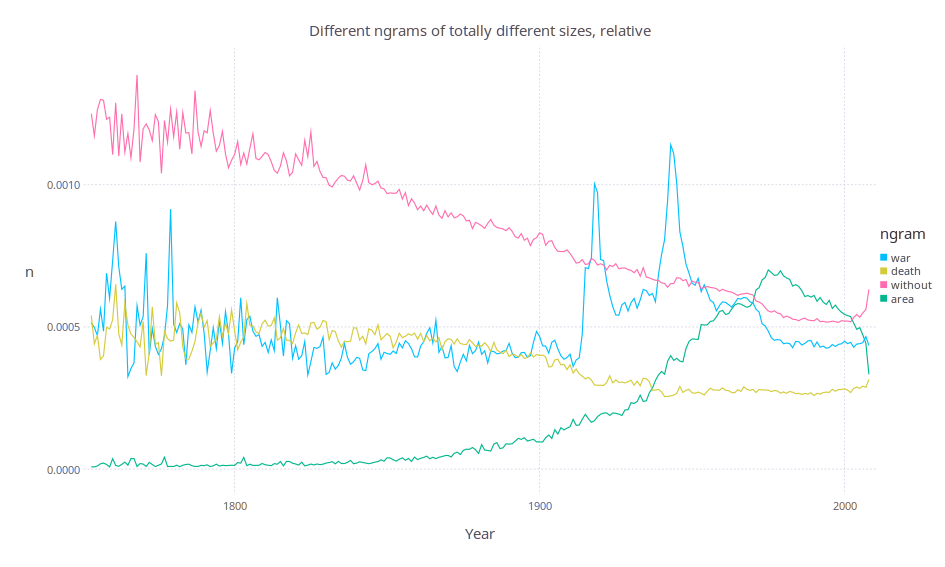

In [6]:
plot_all_that(data, map_s2i, t, ngrams_relative_demo, norm_id, transform_percentages, "Different ngrams of totally different sizes, relative")

## Single scale fitting
Now that we've seen that relative number are not sufficient for our research, we need to find another way to compare time series. Let's start with the following ngrams:

In [7]:
ngrams_gradient_demo = ["know", "kiss", "kind", "keep"]

4-element Array{ASCIIString,1}:
 "know"
 "kiss"
 "kind"
 "keep"

### Linear fitting
First we plot them using no normalization at all. As you can see, the very different value ranges lead to a problem:

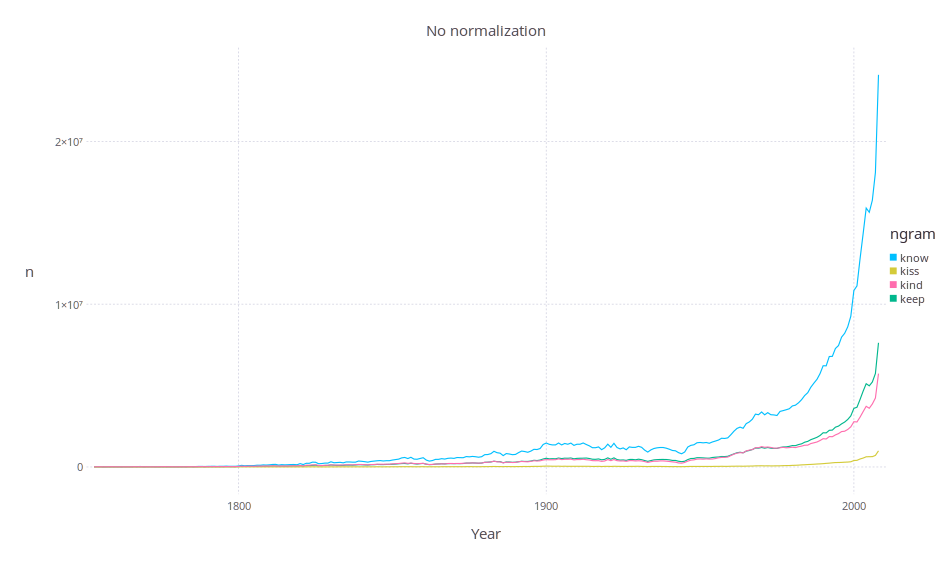

In [8]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo , norm_id, transform_id, "No normalization")

To work around that issue, we normalize the data, first by the maximum value of the time series (*max*) and then by the average value (*avg*):

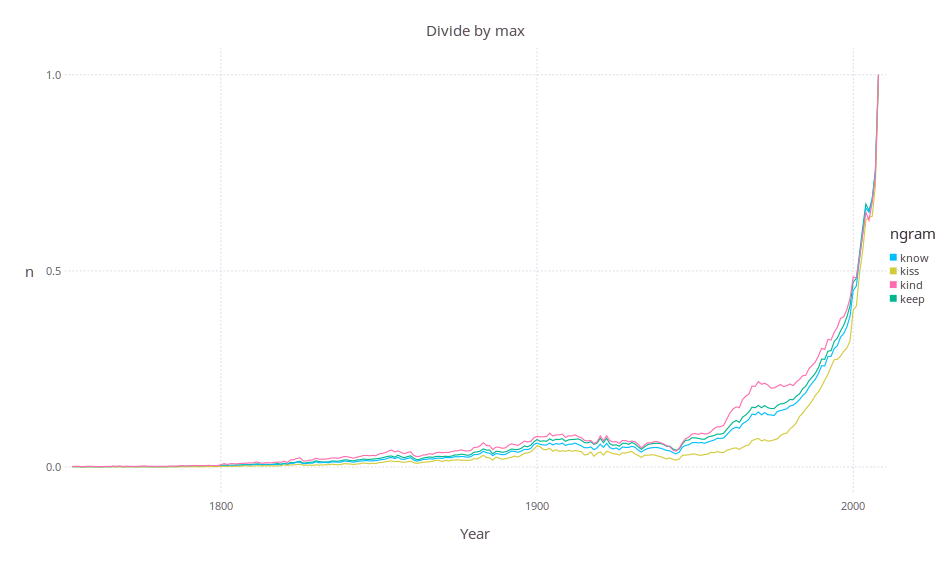

In [9]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_max, transform_id, "Divide by max")

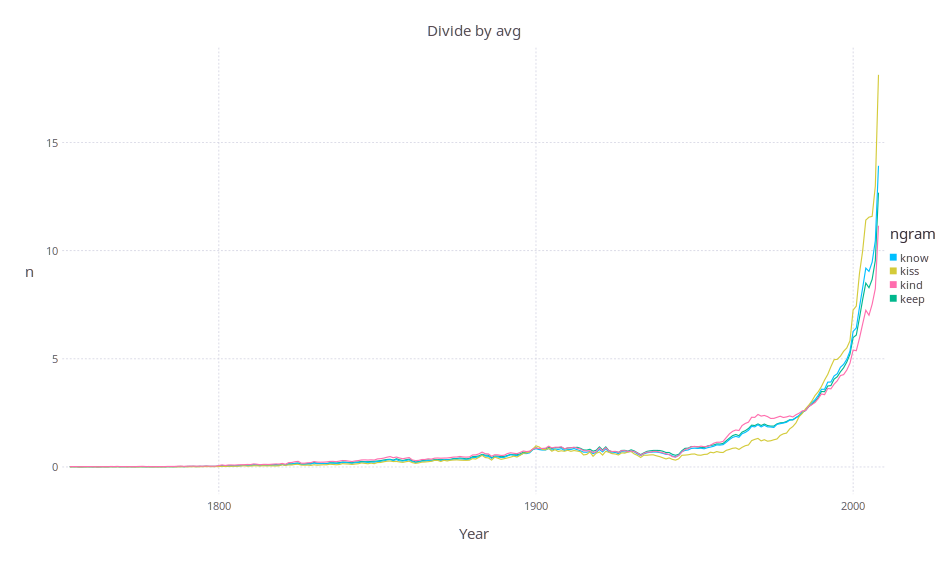

In [10]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_avg, transform_id, "Divide by avg")

While the *max* version fits the recent history quite well it results in a bad comparison for the overall series. The *avg* version works better, but the exponential growth of the overall number (see *totals* plot) makes it hard to define a proper distance measure.

### Logarithmic fitting
It is known [**TODO: ref?**] that logarthmic scales work better for this type of data. The following plots are the same as the plots above with the normalization applied after the logarithmic scale.

*Info: because the time series can be $0$ at some points, we use $\log(x + 1)$ as a transformation function.*

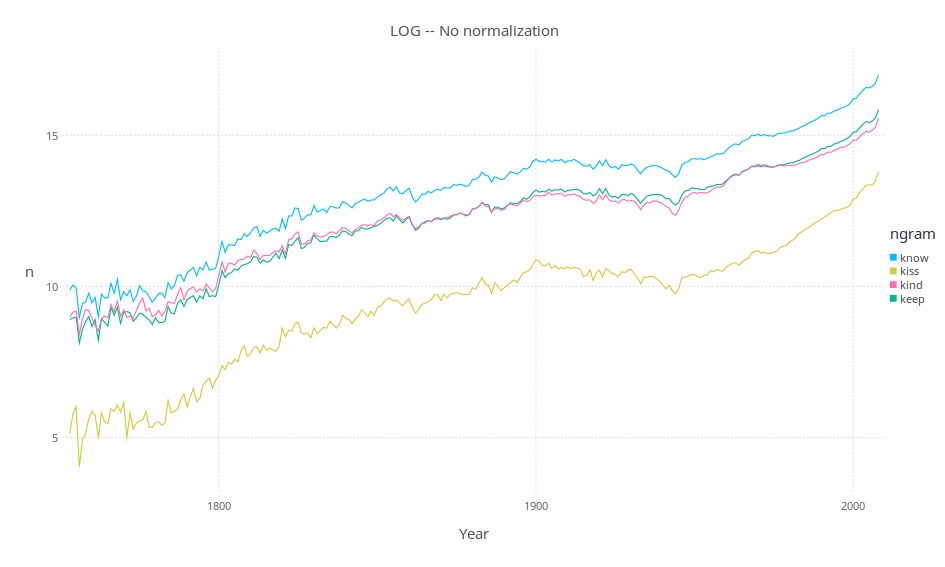

In [11]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_id, transform_log, "LOG -- No normalization")

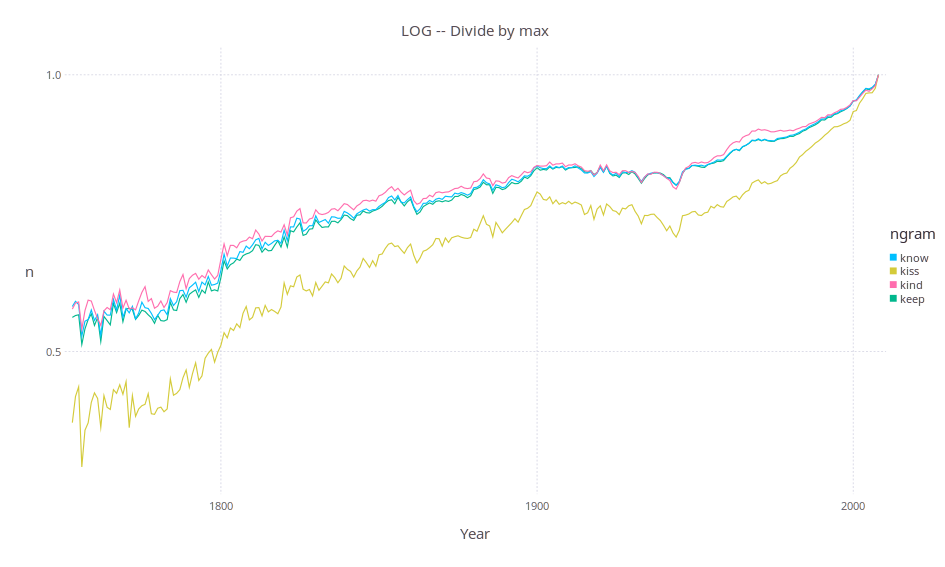

In [12]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_max, transform_log, "LOG -- Divide by max")

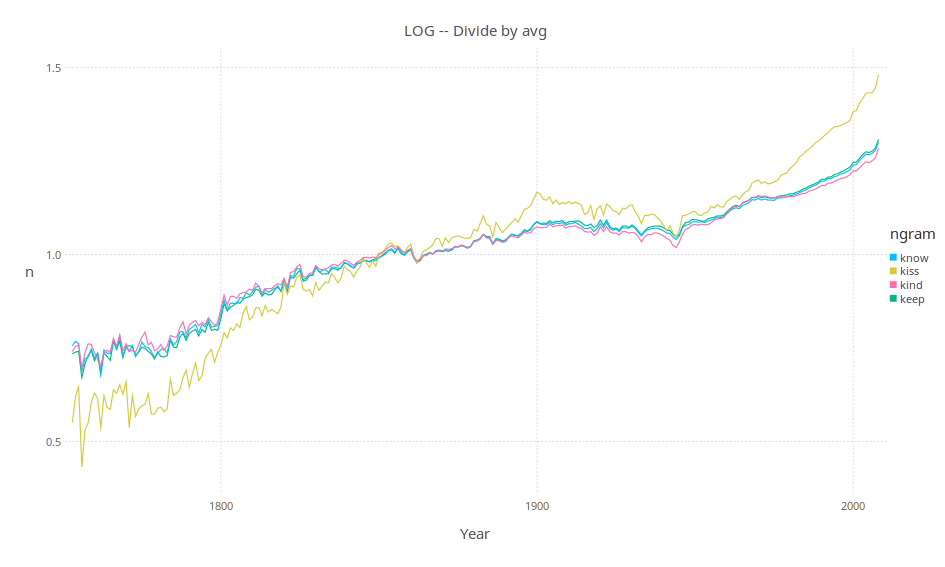

In [13]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_avg, transform_log, "LOG -- Divide by avg")

While the unnormalized and the *max* version still suffer the same problems as described in the last section, the *avg* fits curves very well. The main problem is that the "kiss" time series seems to have very similar changes compared to the others but is hard to fit using a single normalization factor.

## Gradients
In this section we explain why we fit gradients (the derivative) instead of the time series itself. The method somehow follows the idea described in *[DDTW]*. As described in the last section, the fitting of the time series itself (with the *avg* normalization) leads to the problem that, even when two series seem to embody the same changes, they are difficult to align. To solve this, we calculate the $\Delta = 1$ gradient of the time series:

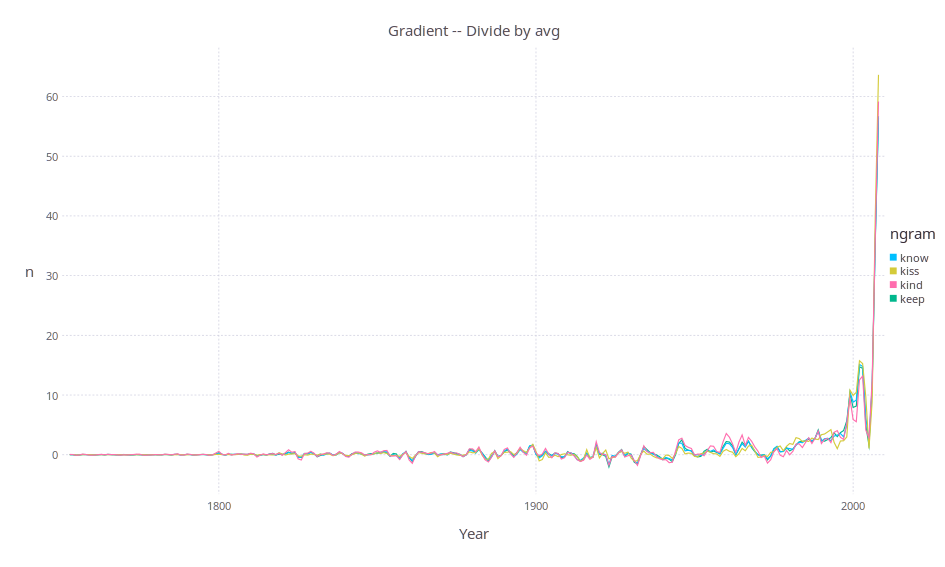

In [14]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_avg, transform_gradient, "Gradient -- Divide by avg")

As you can see here, also the gradient plots suffer from the exponential behaviour. Therefor we calculate the gradient of $\log(x + 1)$ instead of the original time series. Please note that there is no normalization applied before or after the gradient calculation.

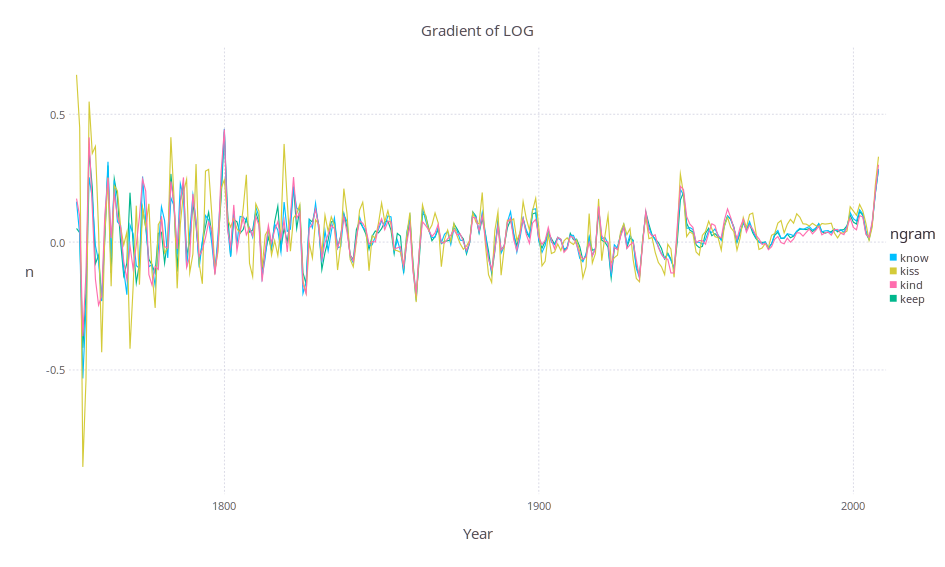

In [15]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_id, transform_loggradient, "Gradient of LOG")

The results are quite noise [**TODO: proof that as a number!**] so for human-readableplots and maybe for machines a smooth version might be a better choice. To do so, we generate Gauss kernels as shown here:

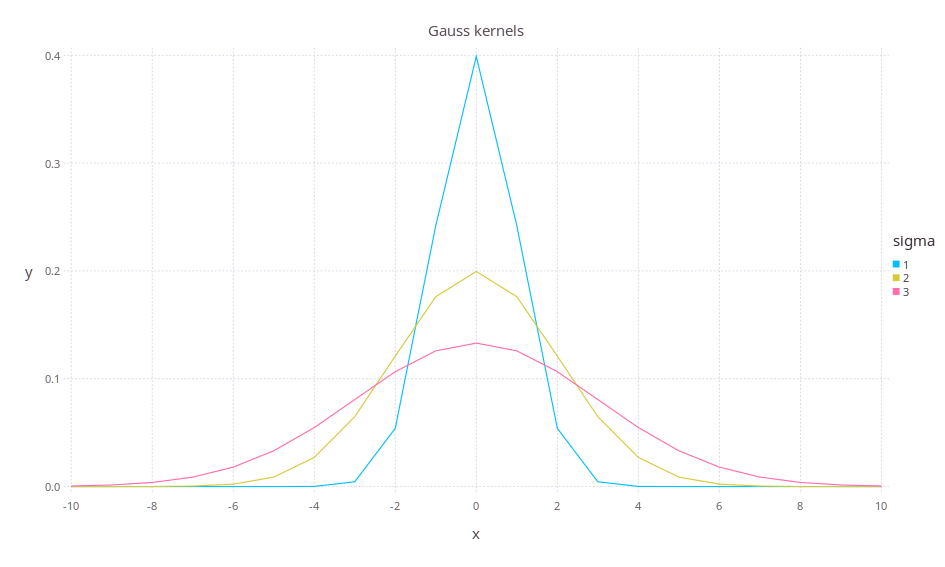

In [16]:
Gadfly.plot(
    vcat(
        DataFrame(x=collect(-10:10), y=kernel_gauss_sigma1, label="1"),
        DataFrame(x=collect(-10:10), y=kernel_gauss_sigma2, label="2"),
        DataFrame(x=collect(-10:10), y=kernel_gauss_sigma3, label="3")
    ),
    x="x",
    y="y",
    color="label",
    Geom.line,
    Guide.colorkey("sigma"),
    Guide.title("Gauss kernels"),
    Guide.xticks(ticks=collect(-10:2:10))
)

**TODO: EWMA for smoothing? Is that better? Faster (<- is that even that important)?**

Now we apply the $\sigma = 1$ kernel after the $\log$ and before the gradient calculation:

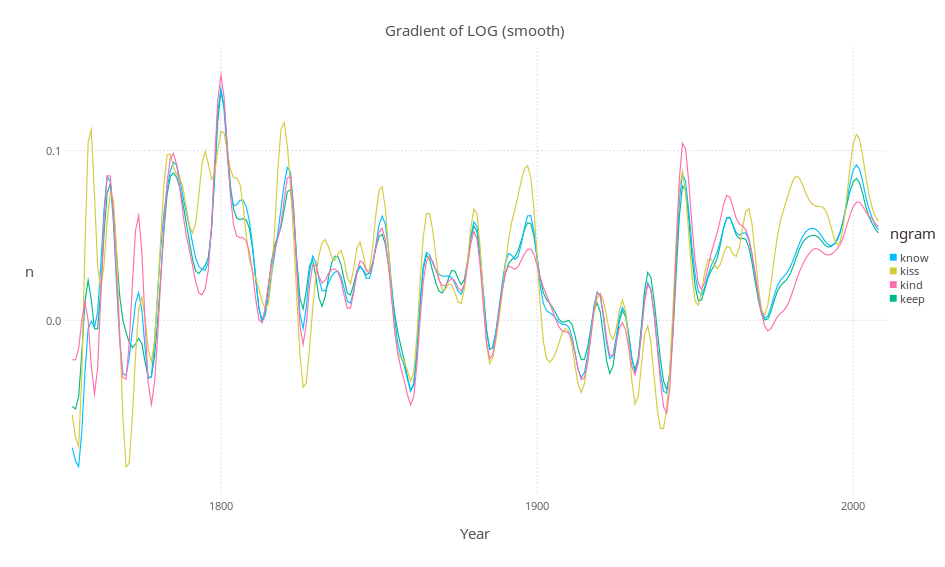

In [17]:
plot_all_that(data, map_s2i, t, ngrams_gradient_demo, norm_id, transform_loggradient_smooth, "Gradient of LOG (smooth)")

Now the similarities of the different series are easy to spot. Take a look at our "kiss" example which was problematic when using a classical distance. Now it is close but not too close to the other series. This makes sense because we have stated that the changes are quite similar but there is clearly a distance between "kiss" and, let's say, "keep".

## DTW
Now we can question if a simple distance like the Euclidean one is good enough to calculate a similarity based on the (smoothed) gradients. Take a look at the spikes of the gradient plot above. They are not aligned (e.g. the one between 1977 and 1993) even when the curves itself have the same structure. This topic was also discussed in *[DDTW]*. To make this unaligned behaviour more clear we show the extrema of the plot above:

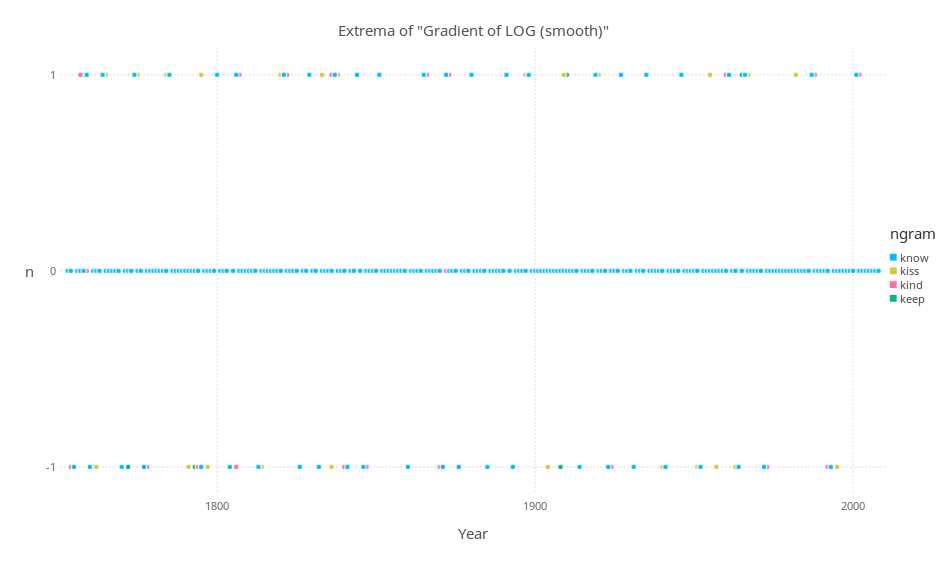

In [18]:
function transform_mark_max(x)
    x = transform_loggradient_smooth(x)
    l = length(x)
    result = zeros(Float64, l)
    for i in 2:(l - 1)
        if x[i] >= x[i - 1] && x[i] >= x[i + 1]
            result[i] = 1
        elseif x[i] <= x[i - 1] && x[i] <= x[i + 1]
            result[i] = -1
        end
    end
    return result
end

plot_all_that(
    data,
    map_s2i,
    t,
    ngrams_gradient_demo,
    norm_id,
    transform_mark_max,
    "Extrema of \"Gradient of LOG (smooth)\"",
    Geom.point
)

As you can see, the extrama are not aligned. Therefore the Eucliden distance will be likely to be higher than it should be (compared to our understanding/model of similarity). To fix this problem we will use DTW as a baseline.

To eliminate unwanted oversized warps, we use a Sakoe-Chiba Band of radius $r$.

## Implementation

The data for ~800k time series (see clean-up document) with a length of 256 years is 1.6GB. We want to query the following data:

> Search the $\textrm{limit}$ most similar entries for a given ngram $\textrm{query}$. Limit the DTW radius to $r$.

To run a complete DTW query ($\textrm{limit} = 10$, $r = 10$), a single-core but vectorized (AVX) implementation takes 2.6sec on an i5-Broadwell laptop. The time is measured after warm-up (memory-mapped IO, so the OS is likely to cache the entire data set in RAM). The implementation is provided by us and does, apart from a semi-modern CPU with proper vector instructions, not require any special hardware. Note that the usage of an AVX512-enabled CPU, a GPU (using OpenCL or CUDA) or an FPGA can improve the performance even further. Also, multi-threading will be added soon.

These results can improved by using indices like *[LB_Keogh]* or *[LB_Improved]*. We expect that it is fast enough to run interactive analysis sessions. It is likely that, before the query time raises to much, the memory aspect becomes a problem. This is one of main reasons why we want to implement a wavelet-based approach.

## Appendix
Some plots that are just here...

### Frequency plots
Frequency plots of smooth (with Gauss $\sigma = 1$) and normal (i.e. w/o smoothing) gradients:

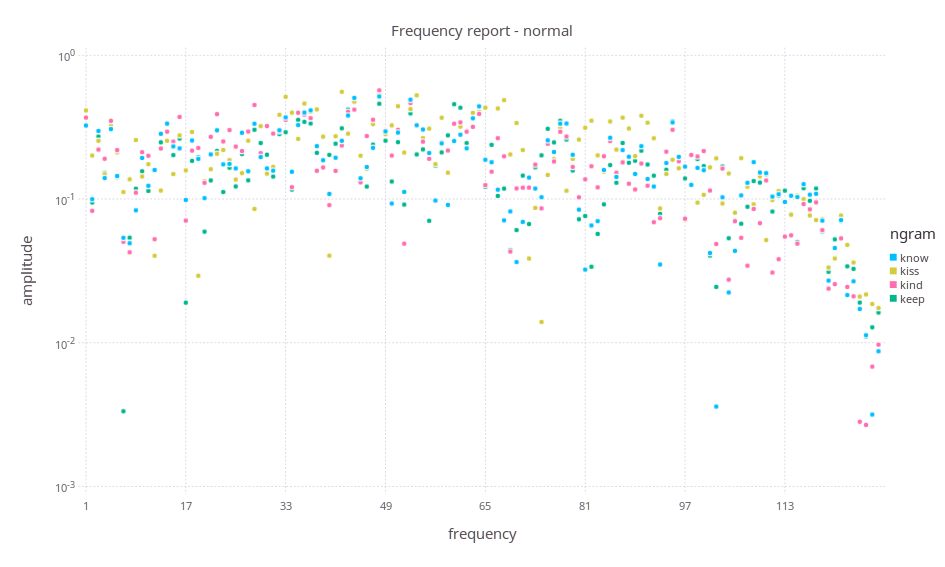

In [19]:
function map_to_frequency(ftransform, ng)
    x = get_from_data(data, map_s2i[ng], norm_id, ftransform)
    abs(rfft(x ./ sum(x))[2:end])
end

function print_frequency_report(ftransform, ftransform_name)
    xvals = collect(1:(m / 2))
    dfs = map(ng -> DataFrame(x=xvals, y=map_to_frequency(ftransform, ng), label=ng), ngrams_gradient_demo)
    df = reduce(vcat, DataFrame(), dfs)
    Gadfly.plot(
        df,
        x="x",
        y="y",
        color="label",
        Geom.point,
        Guide.xlabel("frequency"),
        Guide.ylabel("amplitude"),
        Guide.colorkey("ngram"),
        Guide.title(@sprintf("Frequency report - %s", ftransform_name)),
        Guide.xticks(ticks=collect(1:(m / 16):(m / 2))),
        Scale.y_log10,
        Theme(default_point_size=0.75mm)
    )
end

print_frequency_report(transform_loggradient, "normal")

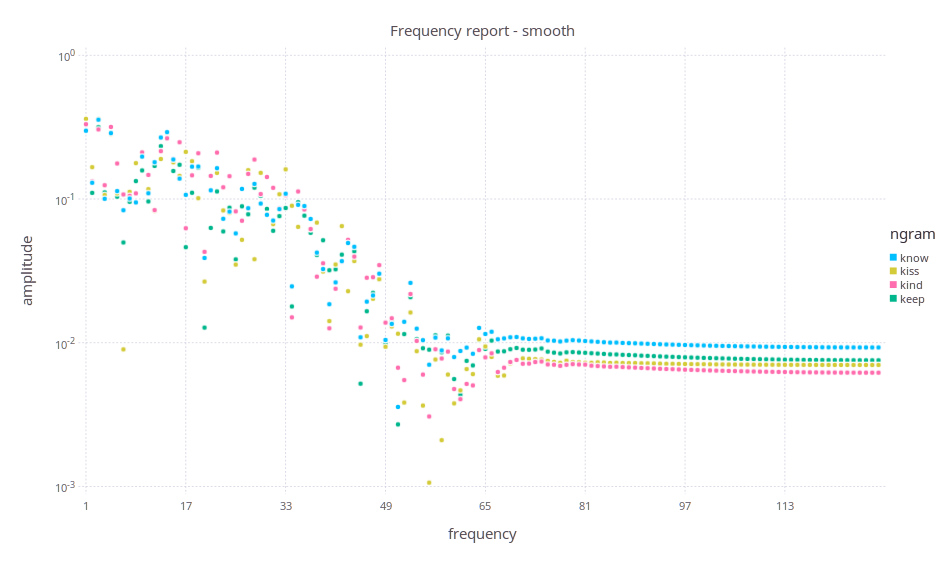

In [20]:
print_frequency_report(transform_loggradient_smooth, "smooth")

## Query samples
Here are some query results with $\textrm{limit} = 10$. Find an analysis below (after all plots). Keep in mind that the "ngams" are stems as described in the clean-up document. It is a simple implementation detail to recover the original ngrams from this data.

In [21]:
function plot_neighbors(l)
    plot_all_that(data, map_s2i, t, l , norm_avg, transform_log, "", Geom.line, Theme(line_width=0.1mm))
end
print()

### "know", normal, $r = 0$

|      ngram |         id |   distance |
|------------|------------|------------|
|       know |     374425 |          0 |
|        not |     495998 |   0.141939 |
|         do |     186992 |   0.144722 |
|      never |     484634 |   0.178808 |
|        how |     314203 |   0.182883 |
|       what |     776346 |   0.194652 |
|        out |     517869 |   0.199214 |
|       much |     466959 |   0.202214 |
|         no |     490129 |   0.204874 |
|        but |      99808 |   0.214951 |
|       have |     295997 |   0.215559 |
|      think |     709683 |   0.215593 |
|       noth |     496152 |   0.216495 |
|         so |     659769 |   0.219338 |
|       that |     706825 |   0.222256 |
|       well |     774059 |   0.223805 |
|         if |     323570 |   0.224754 |
|       come |     138030 |   0.238493 |
|         as |      41565 |   0.240543 |
|       none |     492248 |   0.242934 |

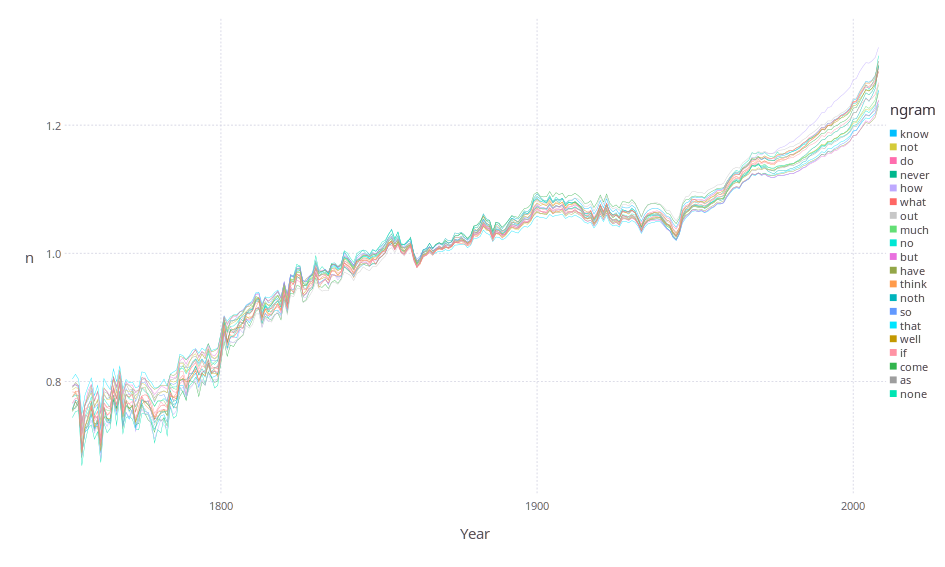

In [22]:
plot_neighbors(["know", "not", "do", "never", "how", "what", "out", "much", "no", "but", "have", "think", "noth", "so", "that", "well", "if", "come", "as", "none"])

### "know", normal, $r = 10$

|      ngram |         id |   distance |
|------------|------------|------------|
|       know |     374425 |          0 |
|        not |     495998 |    0.13748 |
|         do |     186992 |   0.141607 |
|      never |     484634 |   0.163084 |
|        how |     314203 |   0.164379 |
|        out |     517869 |   0.168359 |
|       much |     466959 |   0.175589 |
|       well |     774059 |   0.185498 |
|         no |     490129 |   0.186593 |
|         so |     659769 |   0.189161 |
|       what |     776346 |   0.189691 |
|       noth |     496152 |    0.19686 |
|       none |     492248 |   0.203429 |
|      least |     394810 |    0.20415 |
|        but |      99808 |   0.204469 |
|      think |     709683 |   0.204649 |
|       have |     295997 |   0.204745 |
|         if |     323570 |   0.205097 |
|       like |     403033 |   0.209683 |
|       that |     706825 |   0.213731 |


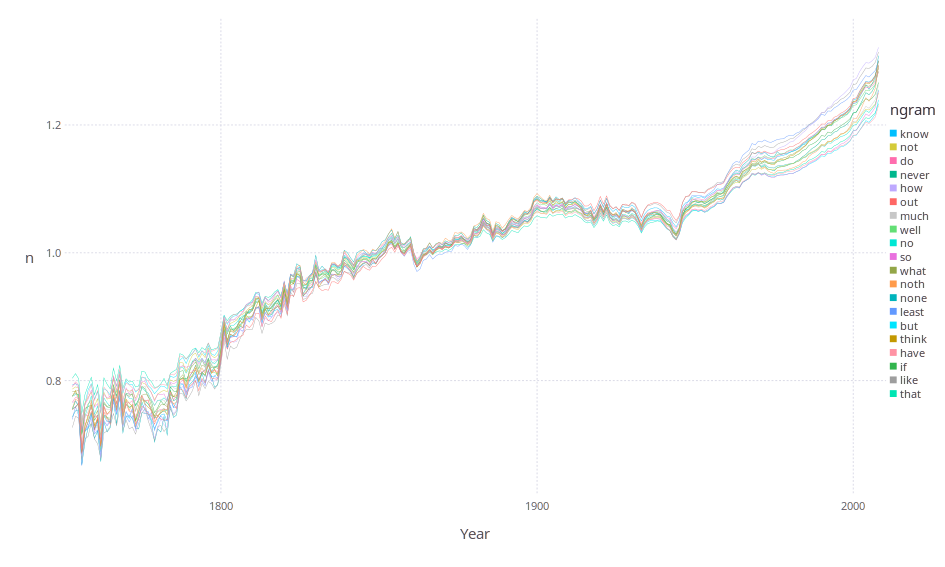

In [23]:
plot_neighbors(["know", "not", "do", "never", "how", "out", "much", "well", "no", "so", "what", "noth", "none", "least", "but", "think", "have", "if", "like", "that"])

### "know", normal, $r = 25$

|      ngram |         id |   distance |
|------------|------------|------------|
|       know |     374425 |          0 |
|        not |     495998 |    0.13748 |
|         do |     186992 |   0.141607 |
|      never |     484634 |   0.163084 |
|        how |     314203 |   0.164379 |
|        out |     517869 |   0.168359 |
|       much |     466959 |   0.175589 |
|       well |     774059 |   0.185498 |
|         no |     490129 |   0.186593 |
|         so |     659769 |   0.189161 |
|       what |     776346 |   0.189691 |
|       noth |     496152 |    0.19686 |
|       none |     492248 |   0.203429 |
|      least |     394810 |    0.20415 |
|        but |      99808 |   0.204469 |
|      think |     709683 |   0.204649 |
|       have |     295997 |   0.204745 |
|         if |     323570 |   0.205097 |
|       like |     403033 |   0.209683 |
|       that |     706825 |   0.213731 |

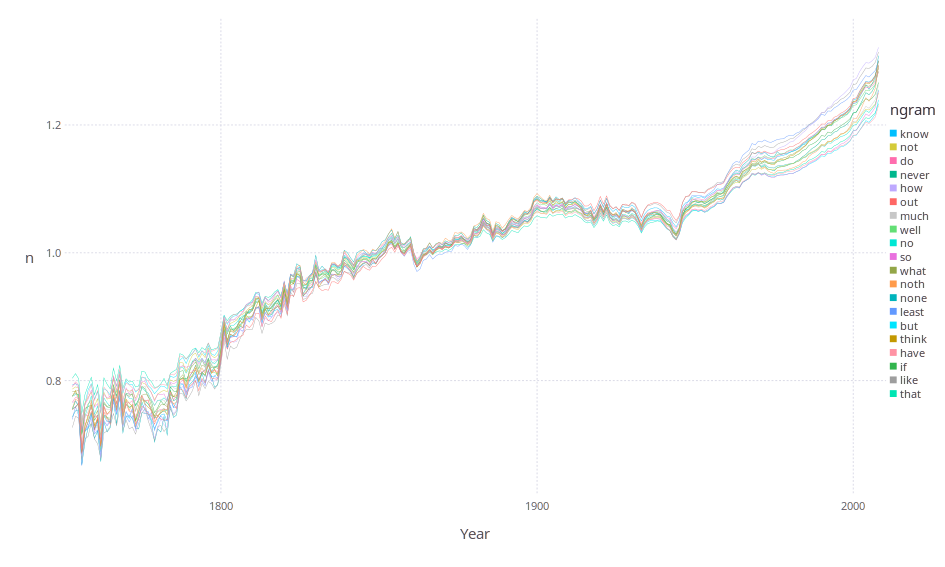

In [24]:
plot_neighbors(["know", "not", "do", "never", "how", "out", "much", "well", "no", "so", "what", "noth", "none", "least", "but", "think", "have", "if", "like", "that"])

### "know", smooth, $r = 0$

|      ngram |         id |   distance |
|------------|------------|------------|
|       know |     374425 |          0 |
|         do |     186992 | 0.00711672 |
|      think |     709683 | 0.00794816 |
|      never |     484634 | 0.00936781 |
|        not |     495998 |  0.0101191 |
|       what |     776346 |  0.0101447 |
|       down |     191342 |  0.0112122 |
|        out |     517869 |  0.0115502 |
|       hear |     297491 |  0.0115766 |
|       like |     403033 |   0.012336 |
|        how |     314203 |  0.0130096 |
|         so |     659769 |  0.0139058 |
|       just |     355247 |  0.0141301 |
|     mistak |     455407 |  0.0141392 |
|       away |      51341 |  0.0142582 |
|     better |      72131 |  0.0148974 |
|       then |     707869 |  0.0149295 |
|       when |     776623 |  0.0152797 |
|        too |     719021 |  0.0153322 |
|       sure |     687708 |  0.0155178 |

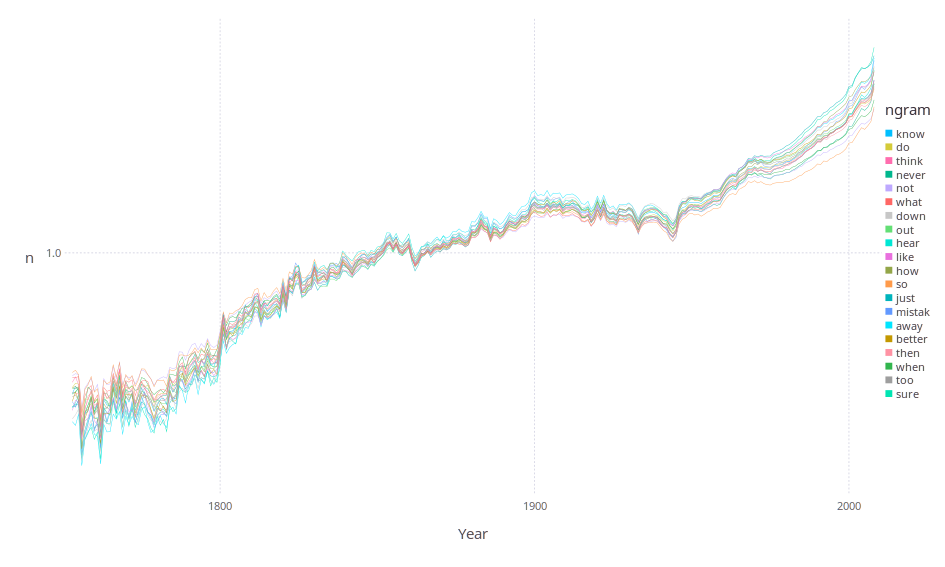

In [25]:
plot_neighbors(["know", "do", "think", "never", "not", "what", "down", "out", "hear", "like", "how", "so", "just", "mistak", "away", "better", "then", "when", "too", "sure"])

### "know", smooth, $r = 10$

|      ngram |         id |   distance |
|------------|------------|------------|
|       know |     374425 |          0 |
|         do |     186992 | 0.00472967 |
|      think |     709683 | 0.00512466 |
|      never |     484634 | 0.00604485 |
|       hear |     297491 |  0.0063785 |
|       what |     776346 | 0.00639809 |
|        not |     495998 | 0.00658675 |
|        out |     517869 |  0.0069251 |
|     better |      72131 | 0.00701643 |
|       just |     355247 | 0.00703574 |
|         so |     659769 | 0.00706447 |
|       turn |     732585 | 0.00725472 |
|       down |     191342 | 0.00758829 |
|        too |     719021 | 0.00764624 |
|        how |     314203 |  0.0077772 |
|       sure |     687708 | 0.00778807 |
|       then |     707869 | 0.00798824 |
|        old |     507338 | 0.00806046 |
|       like |     403033 | 0.00838442 |
|      touch |     720856 | 0.00864659 |

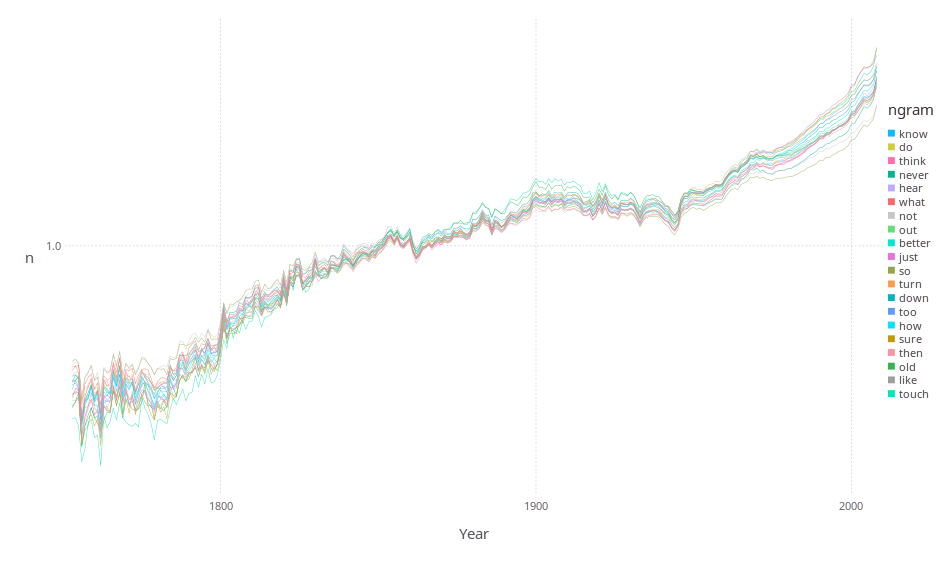

In [26]:
plot_neighbors(["know", "do", "think", "never", "hear", "what", "not", "out", "better", "just", "so", "turn", "down", "too", "how", "sure", "then", "old", "like", "touch"])

### "know", smooth, $r = 25$

|      ngram |         id |   distance |
|------------|------------|------------|
|       know |     374425 |          0 |
|         do |     186992 | 0.00472967 |
|      think |     709683 | 0.00512466 |
|      never |     484634 | 0.00604485 |
|       hear |     297491 |  0.0063785 |
|       what |     776346 | 0.00639809 |
|        not |     495998 | 0.00658675 |
|       just |     355247 | 0.00673784 |
|         so |     659769 |  0.0068951 |
|        out |     517869 |  0.0069251 |
|     better |      72131 | 0.00698145 |
|       turn |     732585 | 0.00725472 |
|        how |     314203 | 0.00753335 |
|        too |     719021 | 0.00757262 |
|       down |     191342 | 0.00758829 |
|        old |     507338 | 0.00762994 |
|       sure |     687708 | 0.00778807 |
|       then |     707869 | 0.00798824 |
|       like |     403033 | 0.00838442 |
|      touch |     720856 | 0.00864659 |

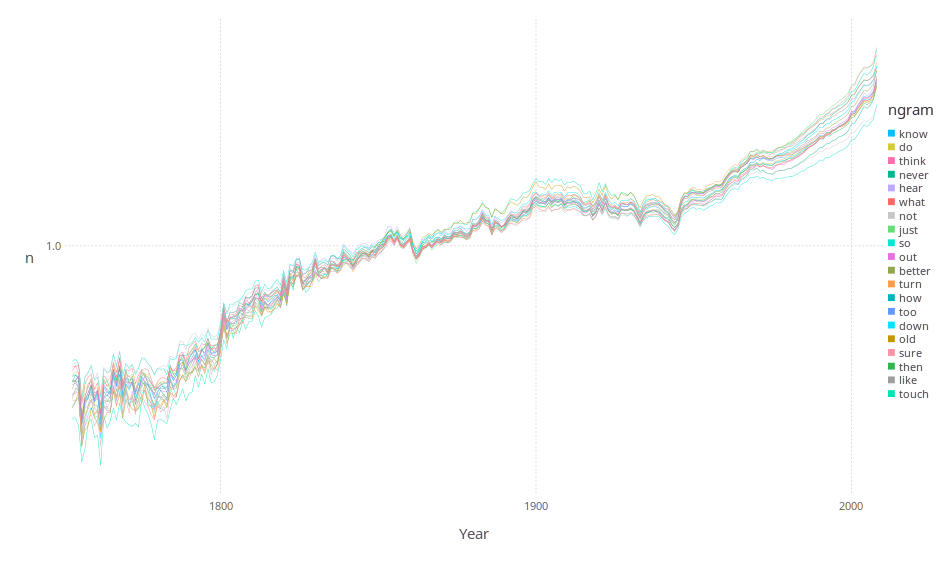

In [27]:
plot_neighbors(["know", "do", "think", "never", "hear", "what", "not", "just", "so", "out", "better", "turn", "how", "too", "down", "old", "sure", "then", "like", "touch"])

### "drug", normal, $r = 0$

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|      stuff |     680443 |    3.76459 |
|       shop |     647600 |    3.96152 |
|    content |     144425 |    4.01256 |
|       cost |     148855 |    4.10541 |
|      devic |     176575 |    4.14587 |
|        rid |     602296 |    4.19532 |
|      worth |     784447 |    4.23004 |
|      three |     711114 |    4.23056 |
|       year |     790706 |    4.23726 |
|       past |     529898 |    4.25616 |
|      small |     658040 |    4.26655 |
|       sinc |     652706 |    4.27805 |
|       back |      53448 |    4.29152 |
|          s |     614870 |    4.29221 |
|      cloth |     133091 |    4.31066 |
|        six |     654856 |    4.31072 |
|      skill |     655719 |      4.311 |
|      paper |     525680 |    4.31511 |
|     resort |     598002 |    4.32685 |

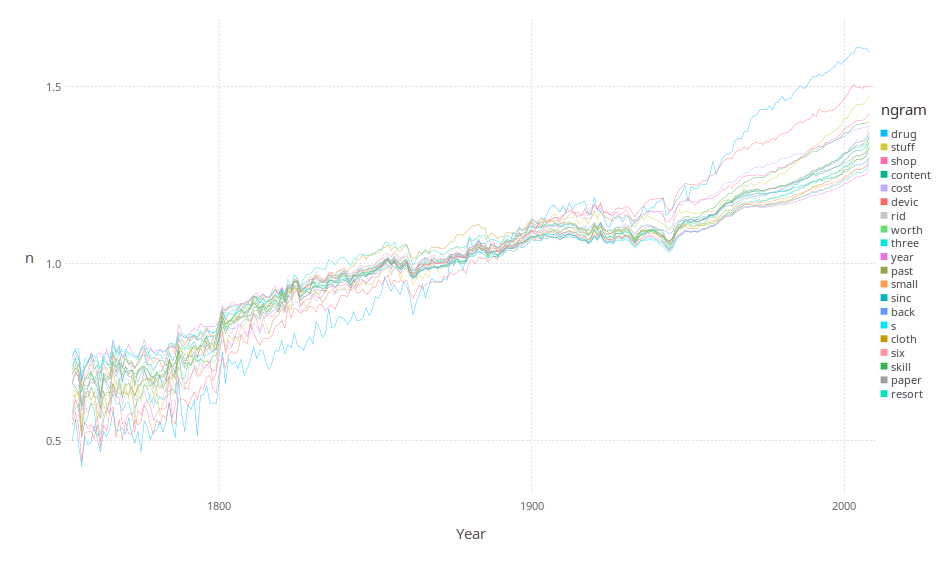

In [28]:
plot_neighbors(["drug", "stuff", "shop", "content", "cost", "devic", "rid", "worth", "three", "year", "past", "small", "sinc", "back", "s", "cloth", "six", "skill", "paper", "resort"])

### "drug", normal, $r = 10$

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|  unwilling |     744858 |    2.17357 |
|       shop |     647600 |    2.18779 |
|      stuff |     680443 |    2.19713 |
|  incorrect |     329479 |    2.26365 |
|   pregnant |     563887 |    2.27844 |
|      spell |     666910 |    2.31001 |
|     invert |     337951 |    2.32369 |
|  physician |     544841 |    2.34504 |
|       scar |     626048 |    2.38096 |
|   squander |     670023 |    2.39971 |
|       test |     704870 |    2.40266 |
|       peak |     532650 |    2.41068 |
|      irrat |     340016 |    2.41555 |
|  philosoph |     543005 |     2.4257 |
|     propag |     570043 |    2.42795 |
|       nurs |     499152 |    2.44259 |
|       whim |     776936 |    2.45039 |
|    pristin |     567260 |    2.45239 |
| dispossess |     184712 |    2.45443 |

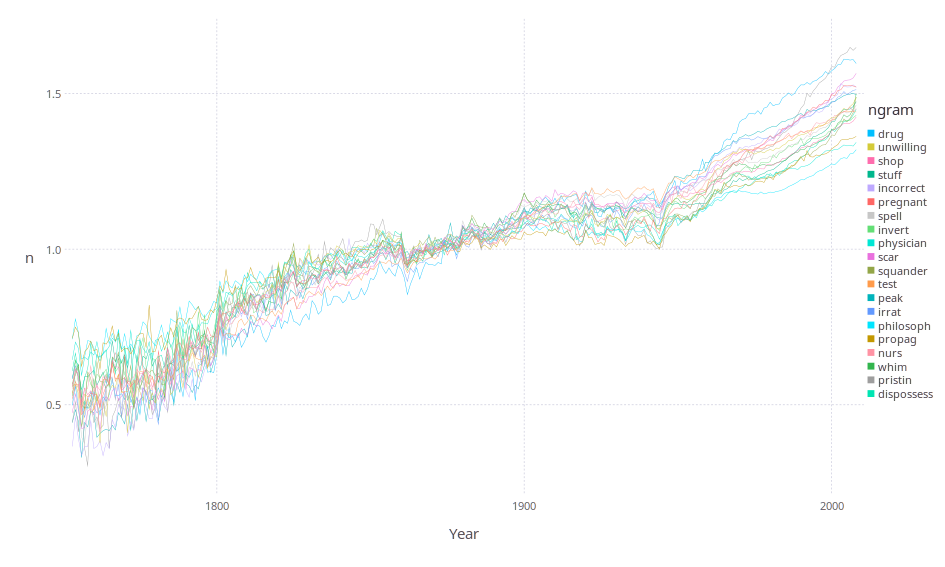

In [29]:
plot_neighbors(["drug", "unwilling", "shop", "stuff", "incorrect", "pregnant", "spell", "invert", "physician", "scar", "squander", "test", "peak", "irrat", "philosoph", "propag", "nurs", "whim", "pristin", "dispossess"])

### "drug", normal, $r = 25$

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|      stuff |     680443 |    2.09019 |
|       shop |     647600 |    2.15851 |
|  unwilling |     744858 |    2.17093 |
|  incorrect |     329479 |    2.22106 |
|      spell |     666910 |    2.26073 |
|   pregnant |     563887 |    2.27844 |
|       peak |     532650 |    2.29614 |
| dispossess |     184712 |    2.31023 |
|     invert |     337951 |    2.32151 |
|  physician |     544841 |    2.34504 |
|       scar |     626048 |    2.36795 |
|       whim |     776936 |     2.3712 |
|   squander |     670023 |    2.37679 |
|      irrat |     340016 |    2.38197 |
|      modem |     457670 |    2.40085 |
|       test |     704870 |    2.40266 |
|  philosoph |     543005 |    2.40322 |
|       talk |     695097 |    2.41201 |
|      figur |     238026 |     2.4207 |

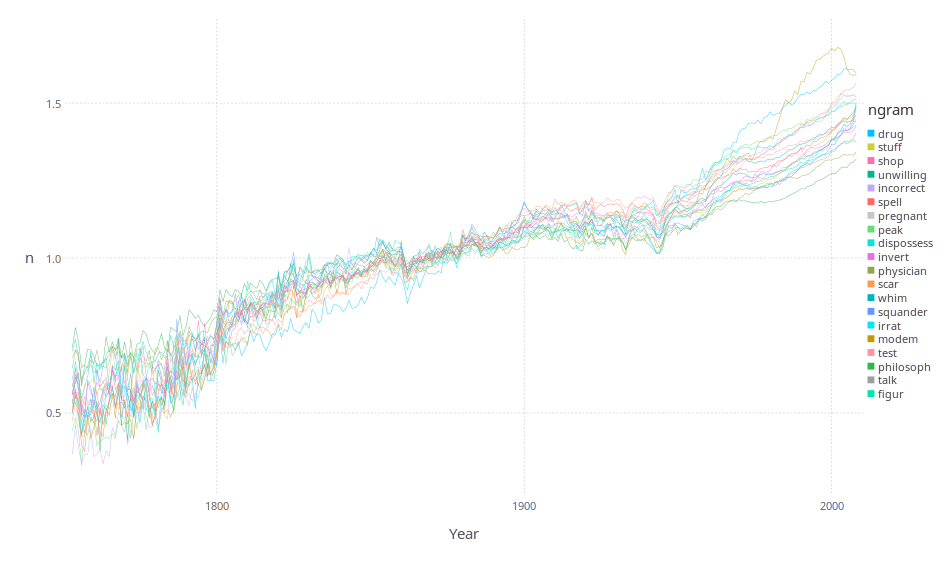

In [30]:
plot_neighbors(["drug", "stuff", "shop", "unwilling", "incorrect", "spell", "pregnant", "peak", "dispossess", "invert", "physician", "scar", "whim", "squander", "irrat", "modem", "test", "philosoph", "talk", "figur"])

### "drug", smooth, $r = 0$

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|       scar |     626048 |   0.193563 |
|  treatment |     724553 |   0.196909 |
|      shift |     645830 |   0.213408 |
|      press |     565389 |   0.213459 |
|       solv |     662192 |   0.216178 |
|        toy |     721617 |   0.220711 |
|  physician |     544841 |   0.221742 |
|       nurs |     499152 |   0.224101 |
|    persist |     538896 |   0.226012 |
|       flow |     242993 |   0.229393 |
|       list |     405548 |   0.229517 |
|       goal |     273013 |   0.233387 |
|          l |     386034 |   0.235145 |
|        tie |     712795 |   0.235836 |
|       skin |     655768 |   0.236959 |
|        tic |     712545 |   0.239326 |
|   pregnant |     563887 |   0.241441 |
|      minut |     453945 |   0.242428 |
|     altern |      20665 |   0.242844 |

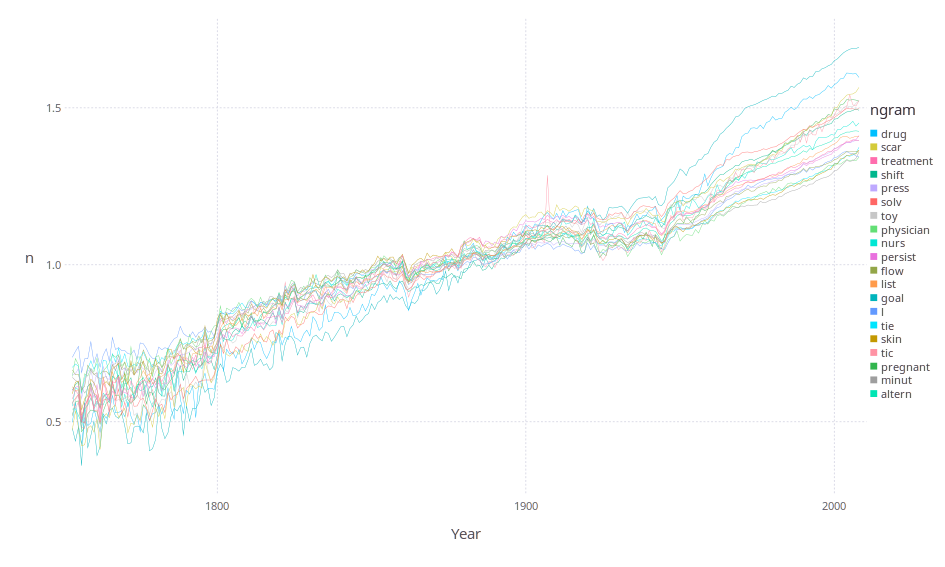

In [31]:
plot_neighbors(["drug", "scar", "treatment", "shift", "press", "solv", "toy", "physician", "nurs", "persist", "flow", "list", "goal", "l", "tie", "skin", "tic", "pregnant", "minut", "altern"])

### "drug", smooth, $r = 10$

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|     intern |     335938 |  0.0653745 |
|       trap |     723861 |  0.0709433 |
|    student |     680259 |  0.0717614 |
|       solv |     662192 |  0.0723427 |
|     ruptur |     613510 |  0.0728451 |
|       tick |     712607 |  0.0735663 |
|       acut |       6130 |  0.0739294 |
|    closest |     133042 |  0.0739848 |
|       nurs |     499152 |  0.0746112 |
|  physician |     544841 |  0.0763685 |
|    complic |     139733 |  0.0771597 |
|      press |     565389 |  0.0791492 |
|       flow |     242993 |  0.0793453 |
|        nal |     475480 |  0.0797839 |
|      polit |     554250 |  0.0800388 |
|        sex |     641699 |  0.0805523 |
|     vantag |     751265 |  0.0809375 |
|     impair |     327512 |  0.0810412 |
|      major |     423044 |  0.0815679 |

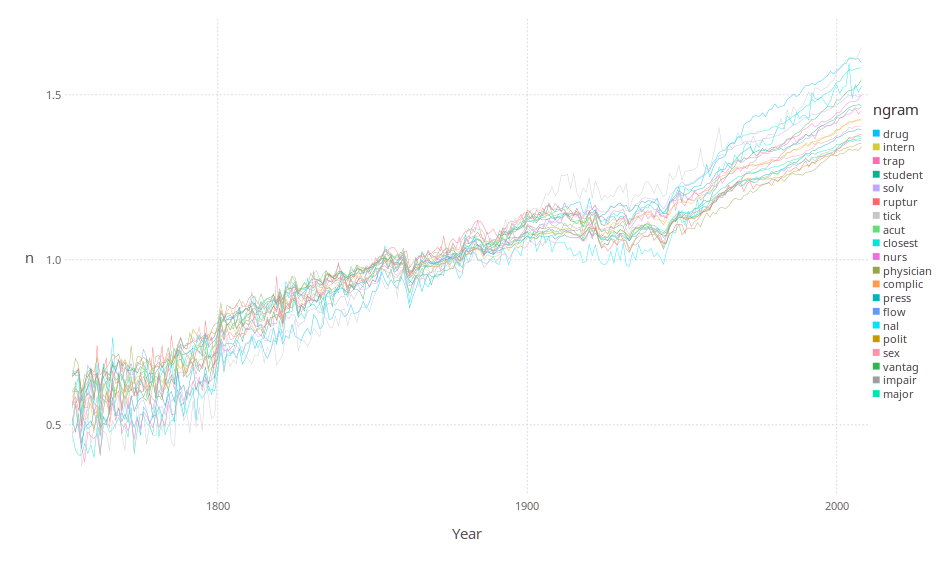

In [32]:
plot_neighbors(["drug", "intern", "trap", "student", "solv", "ruptur", "tick", "acut", "closest", "nurs", "physician", "complic", "press", "flow", "nal", "polit", "sex", "vantag", "impair", "major"])

### "drug", smooth, $r = 25$

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|       scar |     626048 |  0.0606386 |
|     intern |     335938 |  0.0620514 |
|       nurs |     499152 |  0.0636581 |
|        int |     334600 |  0.0640781 |
|  physician |     544841 |  0.0641306 |
|       tick |     712607 |  0.0654864 |
|      press |     565389 |  0.0658813 |
|       weil |     773514 |  0.0663075 |
|  treatment |     724553 |  0.0671087 |
|        toy |     721617 |  0.0673756 |
|    student |     680259 |  0.0674762 |
|    closest |     133042 |  0.0689507 |
|    recruit |     591063 |  0.0692757 |
|        low |     412501 |  0.0693022 |
|       solv |     662192 |   0.069322 |
|     impair |     327512 |  0.0697574 |
|       trap |     723861 |  0.0699573 |
|         ha |     287525 |  0.0708033 |
|        hip |     306944 |  0.0708706 |

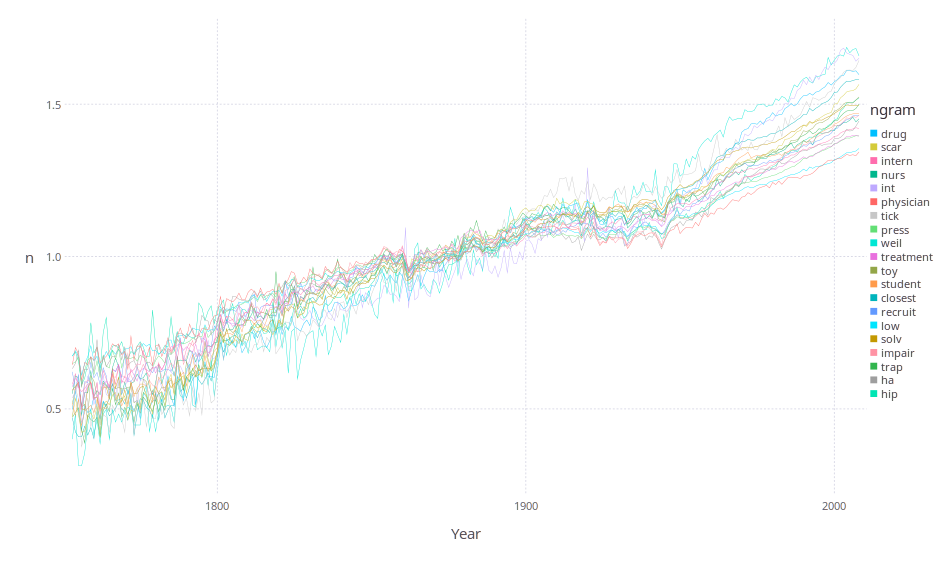

In [33]:
plot_neighbors(["drug", "scar", "intern", "nurs", "int", "physician", "tick", "press", "weil", "treatment", "toy", "student", "closest", "recruit", "low", "solv", "impair", "trap", "ha", "hip"])

### "war", normal, $r = 0$

|      ngram |         id |   distance |
|------------|------------|------------|
|        war |     770257 |          0 |
|       peac |     532570 |   0.916074 |
|       forc |     245478 |    1.20216 |
|      enemi |     211580 |    1.25961 |
|      fight |     237942 |    1.26163 |
|    command |     138418 |    1.27978 |
|     advanc |       8612 |     1.3126 |
|     nation |     478134 |     1.3154 |
|        arm |      39071 |    1.32143 |
|      engag |     211838 |    1.38145 |
|      carri |     109546 |    1.40002 |
|       join |     352036 |    1.40167 |
|    conquer |     142864 |    1.43299 |
|    countri |     150158 |     1.4356 |
|      reduc |     591865 |    1.44405 |
|     govern |     277145 |    1.45345 |
|     courag |     150269 |    1.45993 |
|      enter |     213140 |    1.47168 |
|      order |     512824 |    1.50272 |
|    conduct |     141336 |    1.50846 |

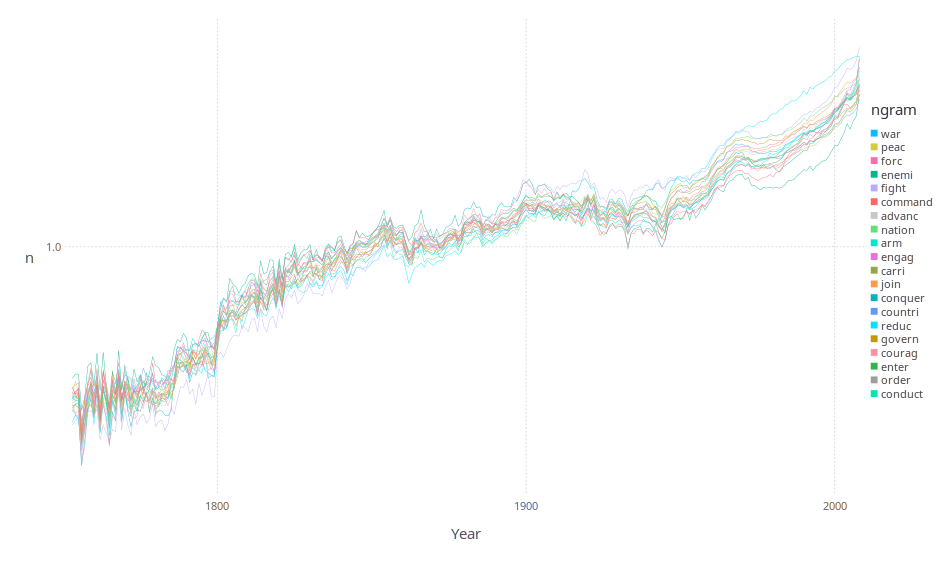

In [34]:
plot_neighbors(["war", "peac", "forc", "enemi", "fight", "command", "advanc", "nation", "arm", "engag", "carri", "join", "conquer", "countri", "reduc", "govern", "courag", "enter", "order", "conduct"])

### "war", normal, $r = 10$

|      ngram |         id |   distance |
|------------|------------|------------|
|        war |     770257 |          0 |
|     nation |     478134 |   0.704156 |
|     advanc |       8612 |   0.738178 |
|       forc |     245478 |    0.73963 |
|   threaten |     711099 |   0.745903 |
|      fight |     237942 |   0.758541 |
|       peac |     532570 |   0.766937 |
|      reduc |     591865 |   0.769582 |
|   interest |     335525 |   0.774001 |
|        arm |      39071 |   0.785923 |
|     govern |     277145 |   0.804191 |
|    success |     683244 |   0.804978 |
|      carri |     109546 |   0.810438 |
|     import |     327990 |   0.811606 |
|    destroy |     175395 |    0.81245 |
|    countri |     150158 |   0.816407 |
|      drive |     193117 |   0.817962 |
|       agre |      12141 |   0.821932 |
|    general |     263097 |   0.823898 |
|    command |     138418 |   0.824128 |

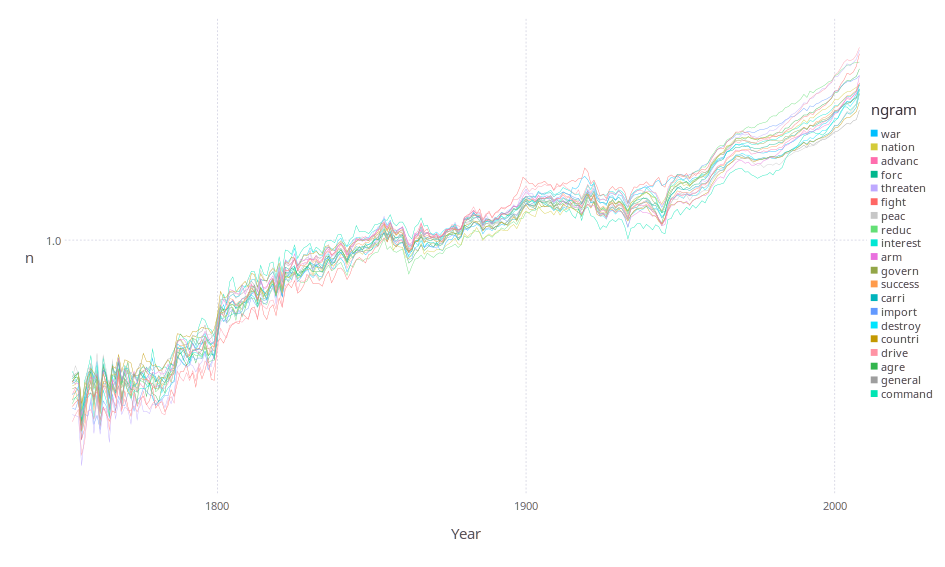

In [35]:
plot_neighbors(["war", "nation", "advanc", "forc", "threaten", "fight", "peac", "reduc", "interest", "arm", "govern", "success", "carri", "import", "destroy", "countri", "drive", "agre", "general", "command"])

### "war", normal, $r = 25$

|      ngram |         id |   distance |
|------------|------------|------------|
|        war |     770257 |          0 |
|     nation |     478134 |   0.704156 |
|     advanc |       8612 |   0.731401 |
|       forc |     245478 |    0.73963 |
|      reduc |     591865 |   0.744589 |
|   interest |     335525 |   0.745823 |
|   threaten |     711099 |   0.745903 |
|      fight |     237942 |   0.758541 |
|       peac |     532570 |   0.766937 |
|        arm |      39071 |   0.785923 |
|    success |     683244 |   0.792973 |
|       agre |      12141 |   0.797457 |
|     govern |     277145 |   0.804191 |
|     import |     327990 |   0.805821 |
|       rais |     584446 |   0.807482 |
|      carri |     109546 |   0.807538 |
|    destroy |     175395 |    0.81245 |
|      engag |     211838 |   0.813696 |
|    countri |     150158 |   0.816407 |
|    general |     263097 |   0.816643 |

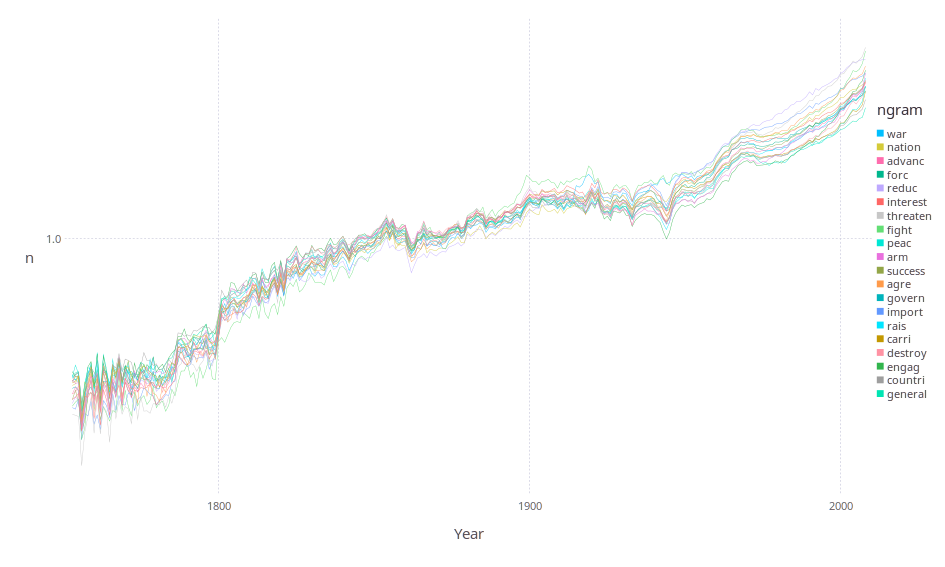

In [36]:
plot_neighbors(["war", "nation", "advanc", "forc", "reduc", "interest", "threaten", "fight", "peac", "arm", "success", "agre", "govern", "import", "rais", "carri", "destroy", "engag", "countri", "general"])

### "war", smooth, $r = 0$

|      ngram |         id |   distance |
|------------|------------|------------|
|        war |     770257 |          0 |
|       peac |     532570 |  0.0857965 |
|      enemi |     211580 |  0.0864811 |
|       armi |      39267 |   0.086701 |
|      fight |     237942 |  0.0891048 |
|   militari |     451977 |  0.0998913 |
|     attack |      46255 |   0.101144 |
|    soldier |     661509 |   0.118971 |
|    shatter |     644111 |   0.129238 |
|    victori |     759174 |   0.135162 |
|      battl |      62107 |   0.137382 |
|      troop |     728129 |   0.139328 |
|      europ |     223228 |   0.140263 |
|       alli |      19088 |   0.140324 |
|     nation |     478134 |   0.152348 |
|      franc |     248707 |   0.152384 |
|      wound |     784629 |    0.15579 |
|    conquer |     142864 |   0.158018 |
|      front |     251781 |   0.160516 |
|    command |     138418 |   0.160604 |

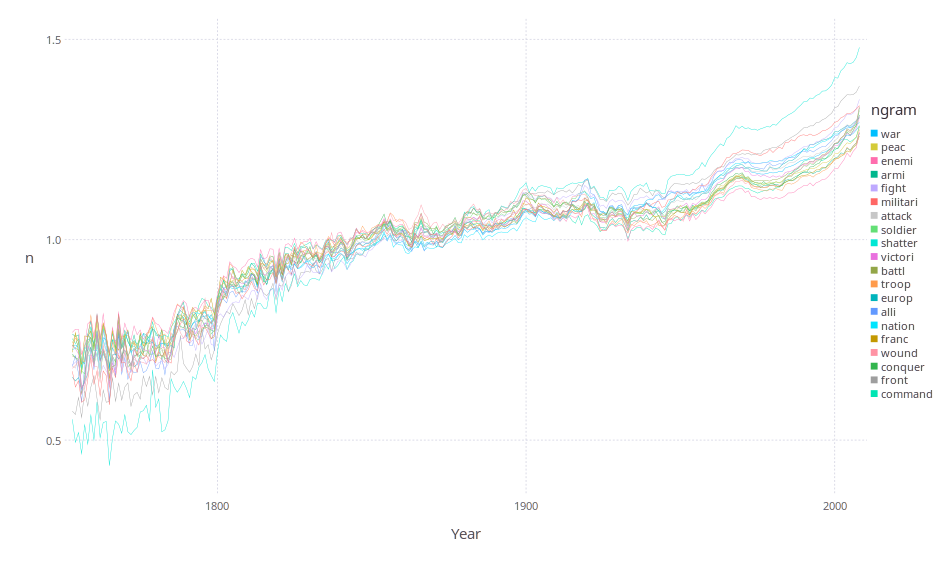

In [37]:
plot_neighbors(["war", "peac", "enemi", "armi", "fight", "militari", "attack", "soldier", "shatter", "victori", "battl", "troop", "europ", "alli", "nation", "franc", "wound", "conquer", "front", "command"])

### "war", smooth, $r = 10$

|      ngram |         id |   distance |
|------------|------------|------------|
|        war |     770257 |          0 |
|   militari |     451977 |  0.0394479 |
|      fight |     237942 |  0.0451741 |
|       peac |     532570 |  0.0467494 |
|       armi |      39267 |  0.0518476 |
|     explod |     226656 |  0.0528603 |
|      enemi |     211580 |  0.0531309 |
|    soldier |     661509 |  0.0538685 |
|       mess |     445599 |  0.0565352 |
|     nation |     478134 |  0.0569918 |
|     attack |      46255 |   0.057958 |
|   unprepar |     743226 |  0.0582819 |
|        tar |     696982 |  0.0583973 |
|       alli |      19088 |  0.0594081 |
|  transport |     723650 |  0.0610185 |
|        pli |     551266 |  0.0618829 |
| sovereignti |     665169 |  0.0629802 |
|      famin |     230366 |  0.0632182 |
|    freedom |     249870 |  0.0634884 |
|       nake |     475374 |  0.0635043 |

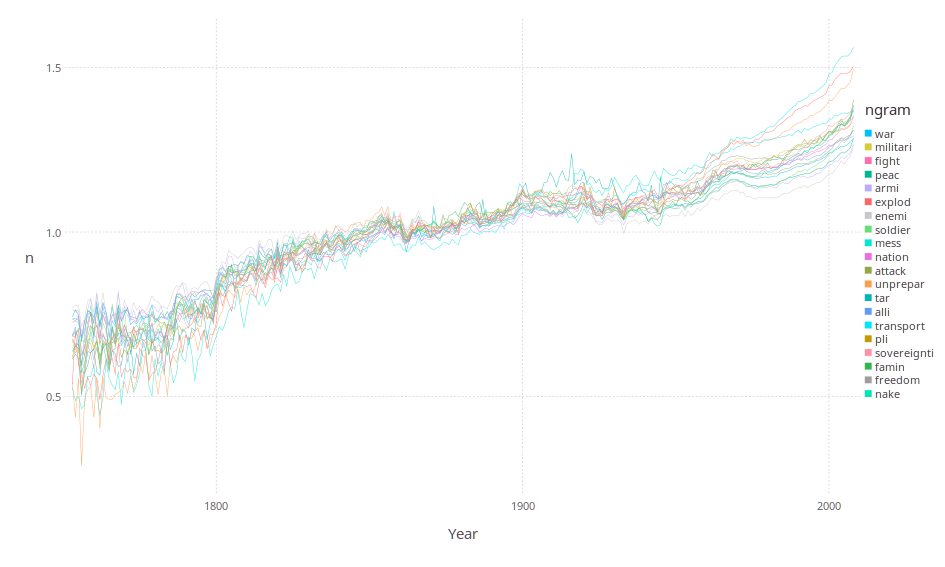

In [38]:
plot_neighbors(["war", "militari", "fight", "peac", "armi", "explod", "enemi", "soldier", "mess", "nation", "attack", "unprepar", "tar", "alli", "transport", "pli", "sovereignti", "famin", "freedom", "nake"])

### "war", smooth, $r = 25$

|      ngram |         id |   distance |
|------------|------------|------------|
|        war |     770257 |          0 |
|      fight |     237942 |  0.0301487 |
|     attack |      46255 |  0.0373505 |
|   militari |     451977 |  0.0389008 |
|   hardship |     293389 |  0.0438954 |
|      battl |      62107 |  0.0445796 |
|     hunger |     317071 |  0.0458917 |
|    conquer |     142864 |  0.0459091 |
|       peac |     532570 |  0.0463105 |
|    shatter |     644111 |  0.0492775 |
|   nineteen |     488169 |  0.0494543 |
|     relief |     594849 |   0.050098 |
|     disast |     183560 |  0.0502794 |
|        arm |      39071 |  0.0506937 |
|     defeat |     168273 |  0.0509997 |
|     impend |     327625 |  0.0512194 |
|      storm |     677536 |  0.0515269 |
|    freedom |     249870 |  0.0515792 |
|       kill |     369745 |  0.0517543 |
|     brutal |      95159 |  0.0517646 |

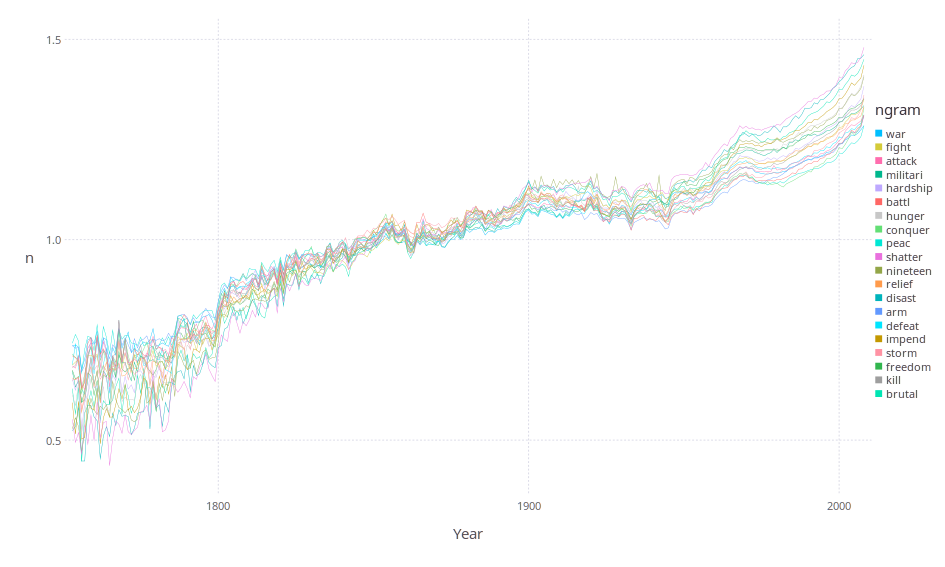

In [39]:
plot_neighbors(["war", "fight", "attack", "militari", "hardship", "battl", "hunger", "conquer", "peac", "shatter", "nineteen", "relief", "disast", "arm", "defeat", "impend", "storm", "freedom", "kill", "brutal"])

### Interpretation
Here we discuss the different parameter choices.

**WARNING: We need to check back with people who know more about this topic! This is section is highly risky!**

**TODO: blind tests for parameters?**

#### normal VS smooth:
Looks like smooth results in more sane results.

#### choice of $r$:
$r = 0$ means "no warping". That contradicts what we have discussed earlier. Now the question is how large $r$ should be than. From a sanity perspective we would suggest $r = 10$, but it seems that also $r = 25$ results in good results.